# Ch08 이미지를 위한 인공 신경망
# 08-1 합성곱 신경망의 구조

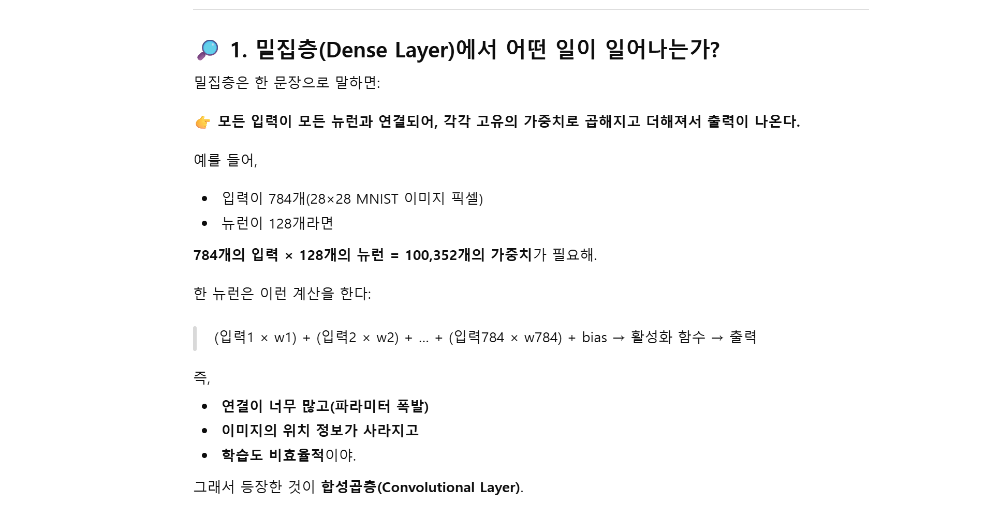
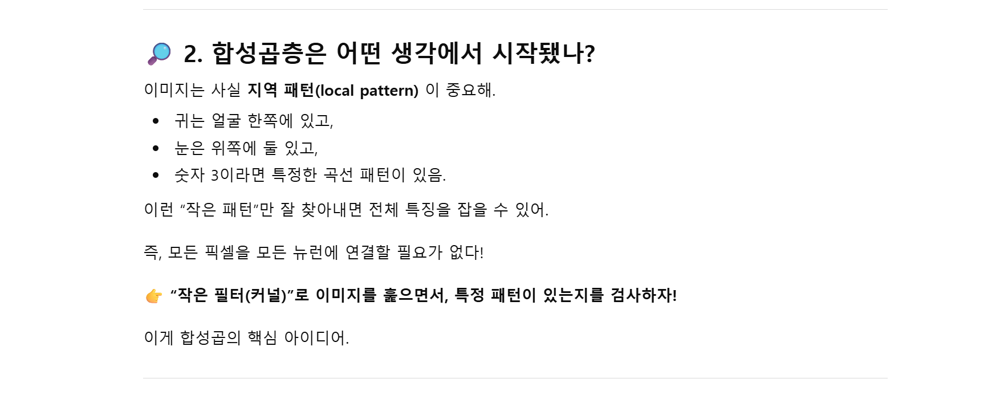
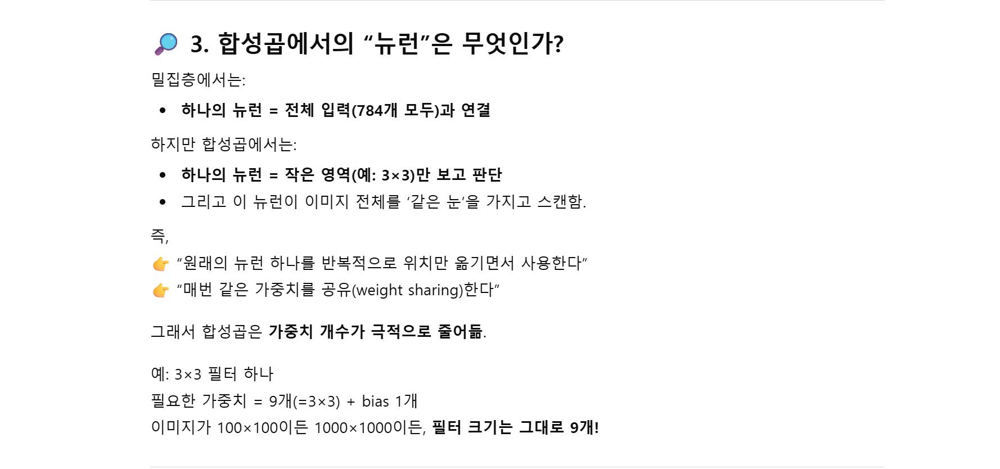
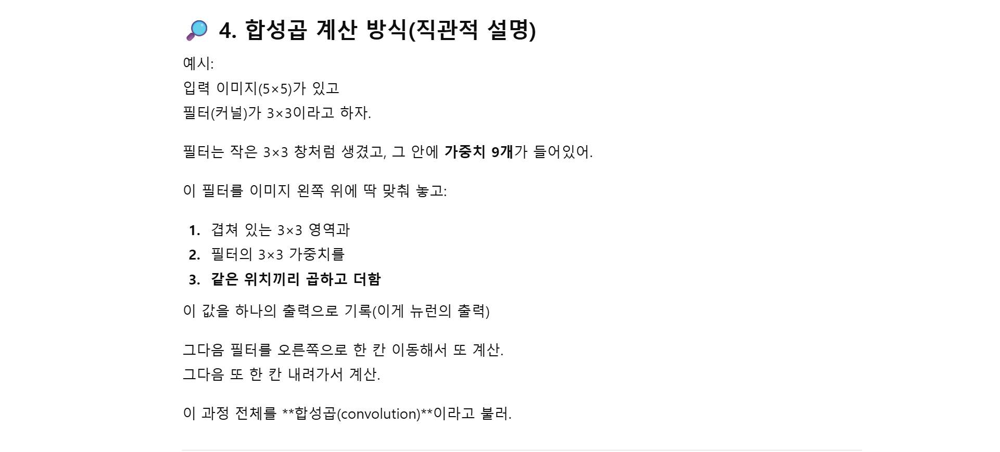
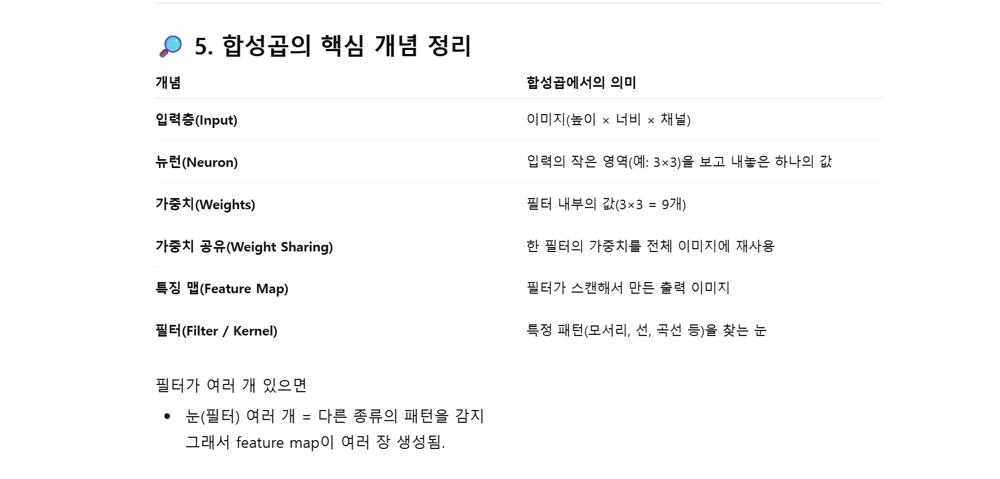
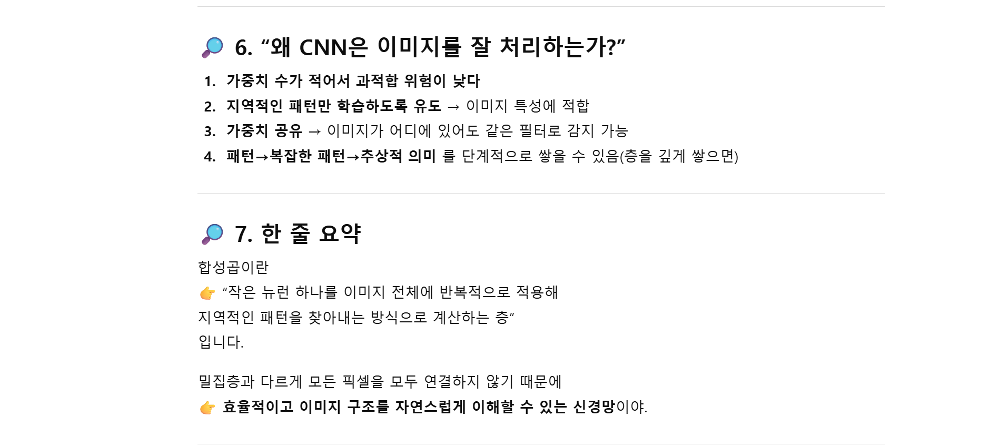

1 ~ 9 의 특성을 합성곱으로 계산하면,        
1개의 뉴런이        
1 ~ 3 / 2 ~ 4 / 3 ~ 5 / 4 ~ 6 / 5 ~ 7 / 6 ~ 8 / 7 ~ 9 총 8세트의 특성과 동일한 가중치를 곱하여 총 8개의 출력을 만든다.      

여기서 3개를 1세트로 한 것은 하이퍼파라미터로, 조절 가능        
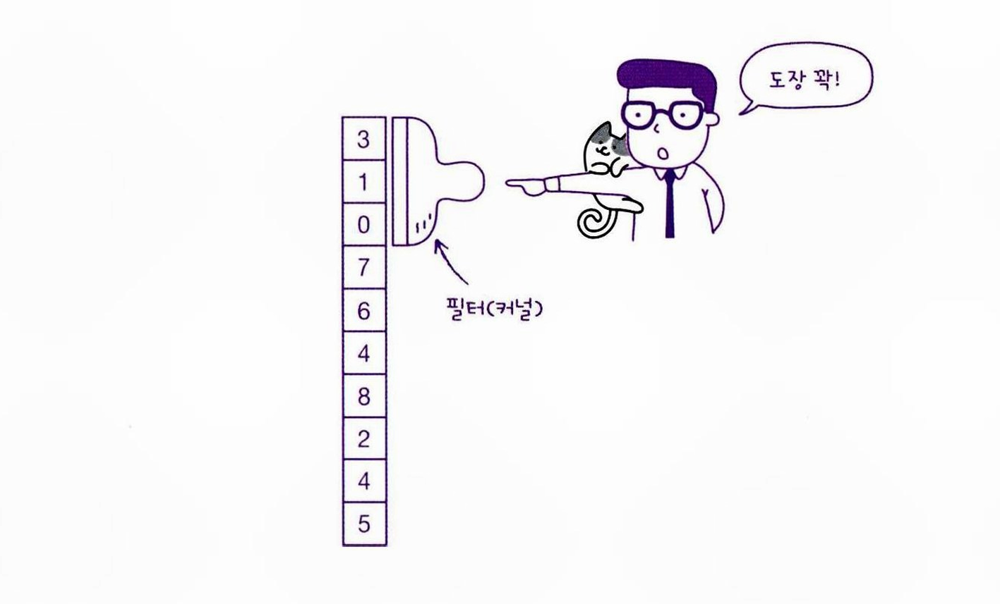

그래서 합성곱 신경망 CNN에서는 뉴런 대신 "필터" 또는   "커널" 이라고 함       
- 필터 : 뉴런의 개수        
- 커널 : 입력에 곱해지는 가중치         

입력이 2차원이면, 필터의 커널 크기도 2차원      

- 특성 맵 feature map : 합성곱 계산을 통해 나온 출력    
            - 커널 크기보다 큰 입력층을 돌아다니면서 계산          
            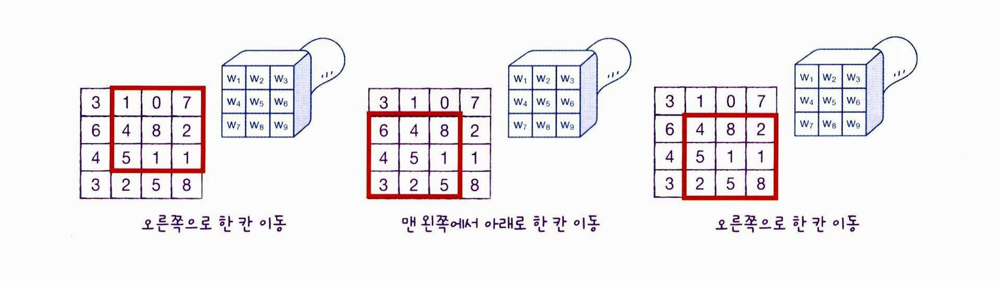 

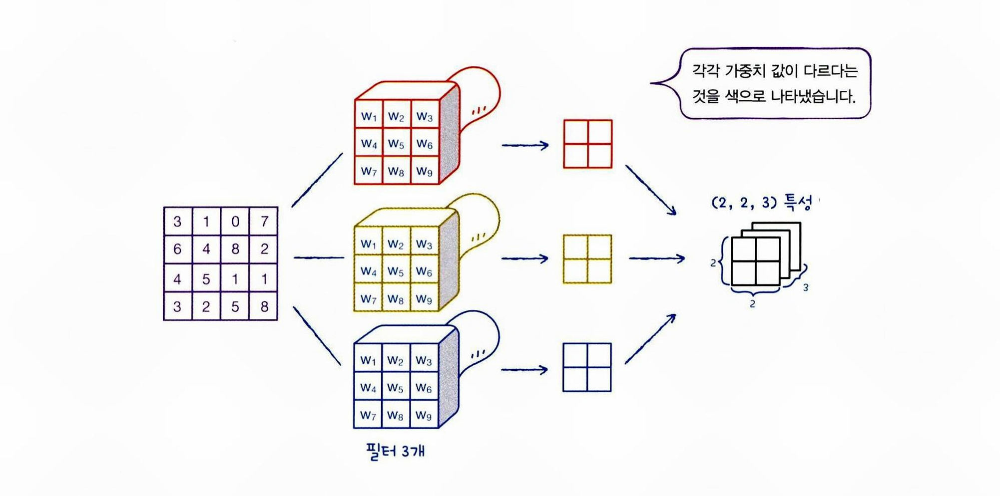

(2,2) 의 필터를 사용해서 3개의 출력이 나왔으므로 (2, 2, 3) 으로 표현함  



## 1. 케라스 합성곱 층

왼 -> 오 / 위 -> 아래 로 이동하는 2D 합성곱 커널은 `Conv2D` 클래스로 제공       
합성곱 신경망 = 1개 이상의 합성곱 층을 사용한 인공 신경망. 즉 밀집층 + 합성곱 층 도 합성곱 신경망

In [1]:
import keras
keras.layers.Conv2D(10, kernel_size=(3,3), activation = 'relu') #필터 개수 10개, 커널 사이즈 3x3, 활성화 함수 relu
#필터 개수와 커널 사이즈는 모두 하이퍼 파라미터, 보통 3x3 이나 5x5를 사용

2025-11-24 22:15:25.986599: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-24 22:15:26.360048: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763990126.484901    3103 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763990126.520873    3103 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-24 22:15:26.176367: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

<Conv2D name=conv2d, built=False>

### 1.1. 패딩과 슬라이드


 **<4 x 4 원본을 계산하려면? >**    

 *1. 일반적으로는 크기보다 작은 결과가 나온다*      
 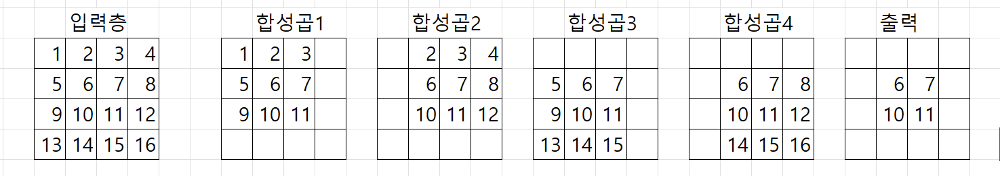
 - 입력 크기: (4 × 4)       
 - 커널 크기: (3 × 3)       
 - 기본적인 합성곱 결과: (2 × 2)

**가운데 4개만 4번 찍히나 왼쪽 끝 모소리 같이 1번만 찍히는 위치도 생김**

*2. 값이 없는 빈 입력칸을 주위에 둘러 싸면 커널이 움직일 수 있는 공간이 생긴다*     
`Padding`       
 = 입력 이미지의 가장자리 바깥에 0을 덧붙여서 크기를 키우는 것.

예를 들어,          
실제 입력은 (4×4)인데       
바깥에 1칸씩 0을 둘러치면 (6×6)이 됨.       

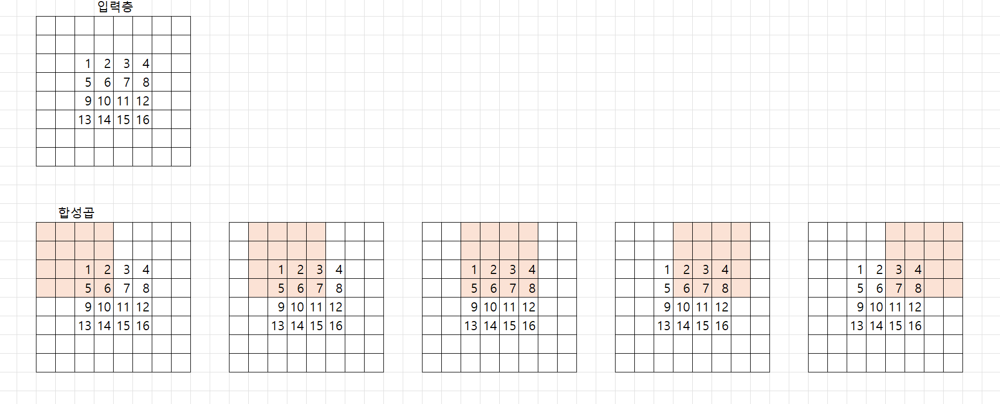
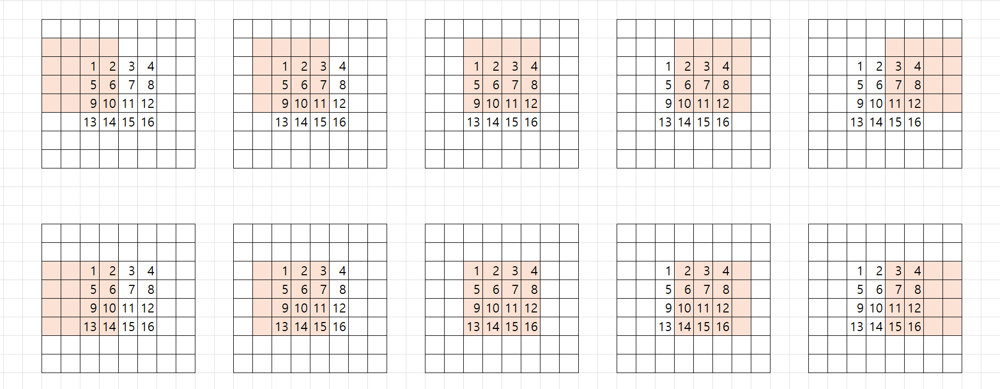
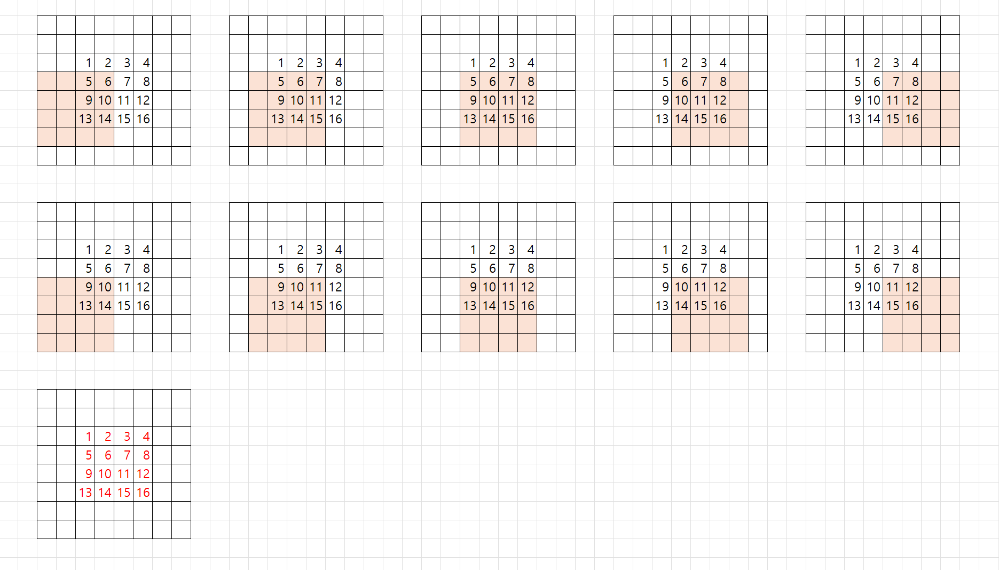

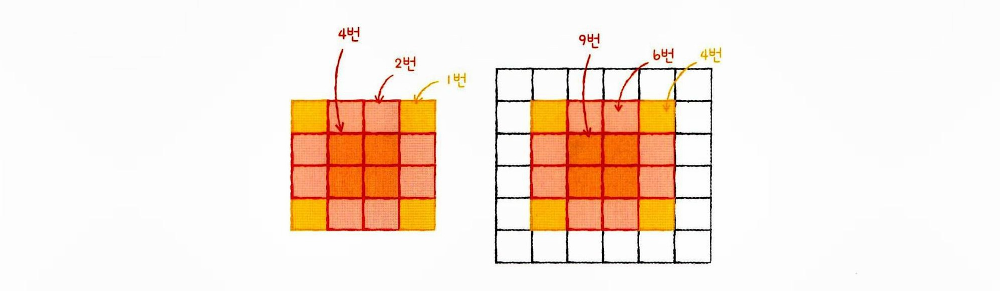

패딩을 하면 찍히는 횟수의 차이가 줄어듦     


`same padding 세임 패딩` : 입력과 특성의 크기를 동일하게 만들기 위해 주위에 0으로 패딩하는 것       
`valid padding 밸리드 패딩` : 패딩 없이 순수한 입력배열에서 합성곱을 하여 특성 맵을 만드는 것 

In [ ]:
keras.layers.Conv2D(10, kernel_size=(3,3), activation='relu', padding='same') #same padding

<Conv2D name=conv2d_1, built=False>

`스트라이드 stride` : 필터가 이동하는 크기.     
    - 기본은 1, 1칸

In [ ]:
keras.layers.Conv2D(10, kernel_size=(3,3), activation='relu', padding='same', strides=1) # 1 도 되고, (1,1)위 아래도 가능

<Conv2D name=conv2d_2, built=False>

### 1.2. 풀링 Pooling
은 합성곱 층에서 만든 특성 맵의 가로세로 크기를 줄이는 역할을 수행      
그러나 특성 맵의 크기는 줄지 않음       
(2, 2, 3) -> (1, 1, 3)      
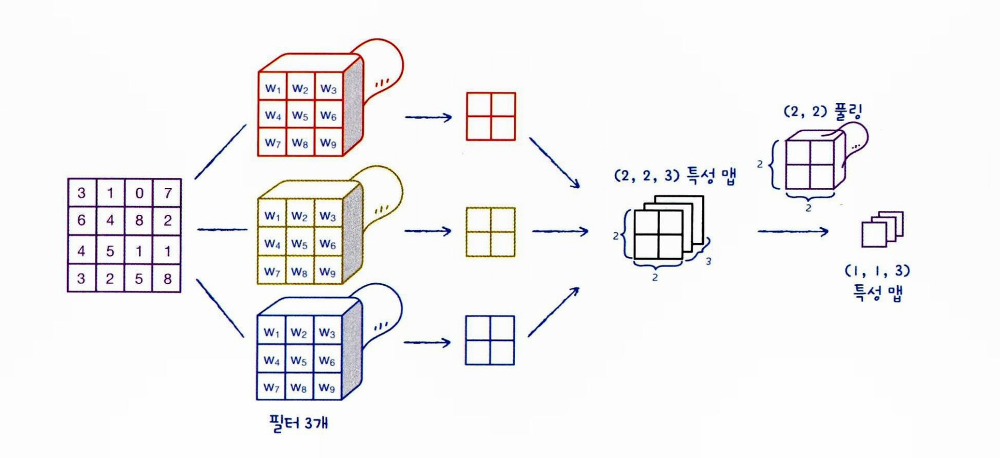

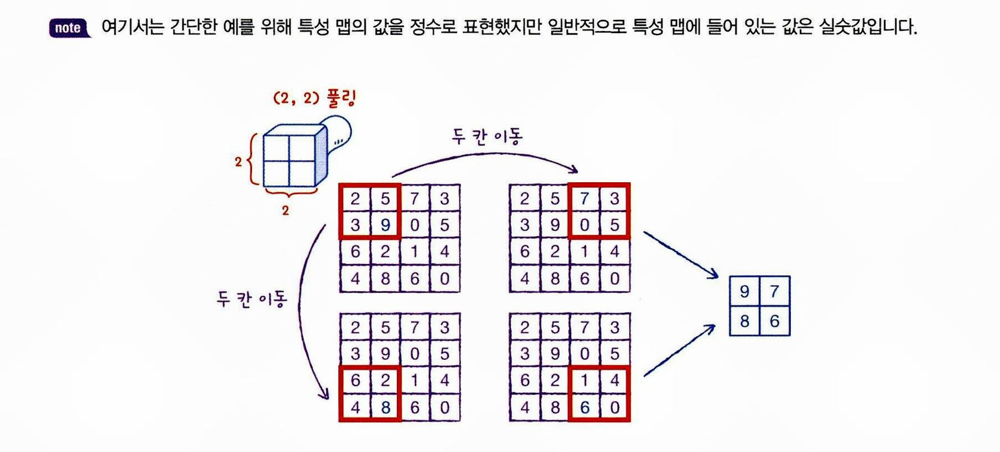

최대 풀링 : 가장 큰 값을 고름       
    즉, (2, 3, 5, 9) 중 9 + (0, 3, 5, 7) 중 7 + (2, 4, 6, 8) 중 8 + (0, 1, 4, 6) 중 6       


풀링 크기가 (2, 2) 면 stride = 2 / (3, 3)이면 stride = 3 

In [4]:
keras.layers.MaxPooling2D(2)

<MaxPooling2D name=max_pooling2d, built=True>

In [5]:
keras.layers.MaxPooling2D(2, strides=2, padding='valid')

<MaxPooling2D name=max_pooling2d_1, built=True>

최댓값 대신 평균값을 사용하려면 `AveragePooling2D` 

## 2. 합성곱 신경망의 전체 구조

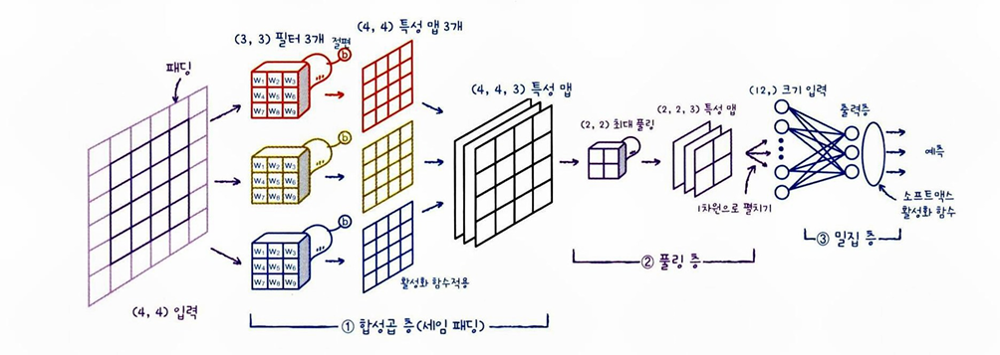
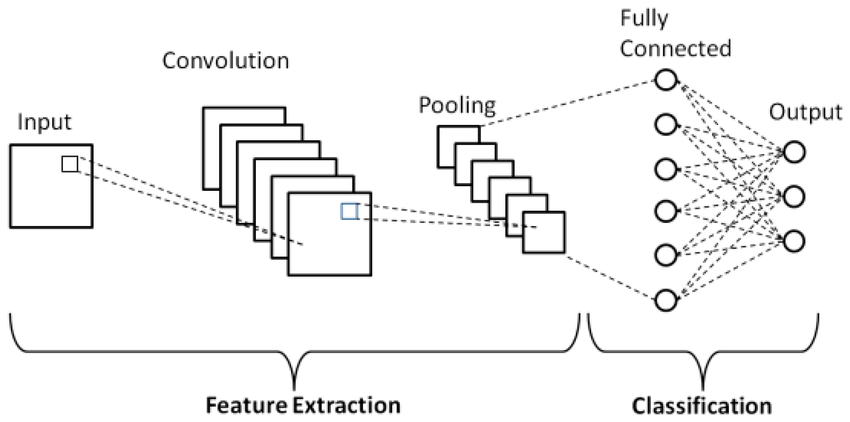
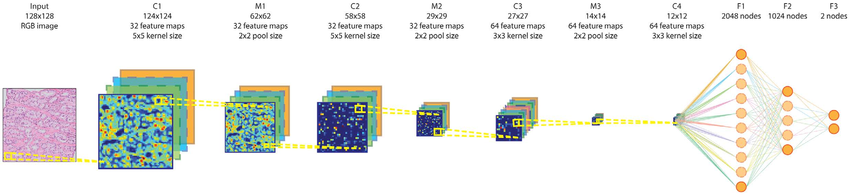

### 컬러 이미지를 사용한 합성곱

RGB 컬러 이미지라면 빨강, 초록, 파랑 채널로 구성되어 있으므로, 3차원 배열로 표시되어야 함   
(4, 4)이미지 -> rgb -> (4, 4, 3)        

따라서, 도장(필터)에도 깊이가 생김.     
(3, 3)이라면 (3, 3, 3)의 필터       

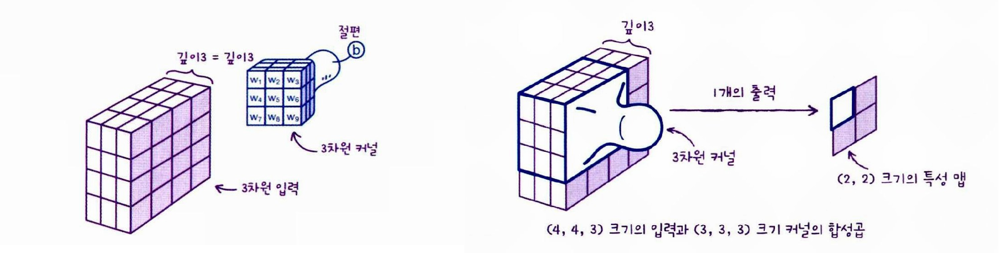


**<2차원의 합성곱층이라면?>**       
케라스 합성곱 층은 항상 3차원의 입력을 기대하므로 2차원이더라도 꼭 3차원의 배열로 변환해야 함       

**<합성곱 층 -> 풀링 층 -> 합성곱 층이라면?>**
- (4, 4, 5) -> 풀링층 -> (3, 3, ?)              
        - 1차 합성곱 층에서 깊이가 5였으므로, 2차 에서도 깊이는 5가 되어야 함       
- 따라서, (3, 3, 5) 인 합성곱 층을 펴볌 3 * 3* 5 = 45개의 가중치를 곱하고 절편을 더한 1개의 출력을 만듦         

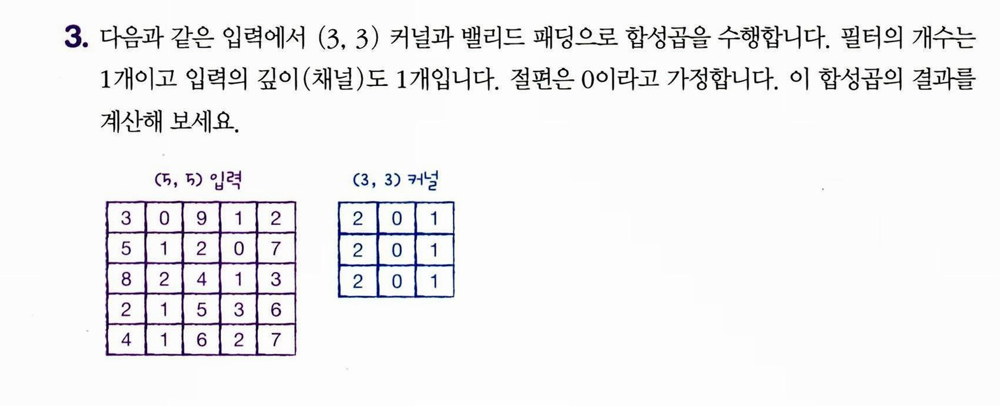

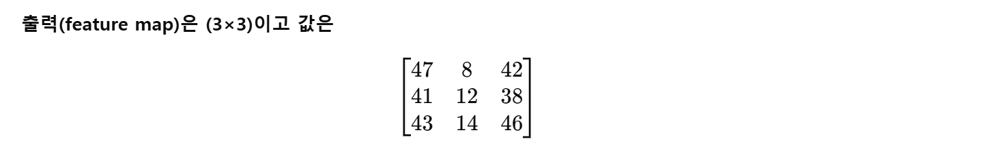

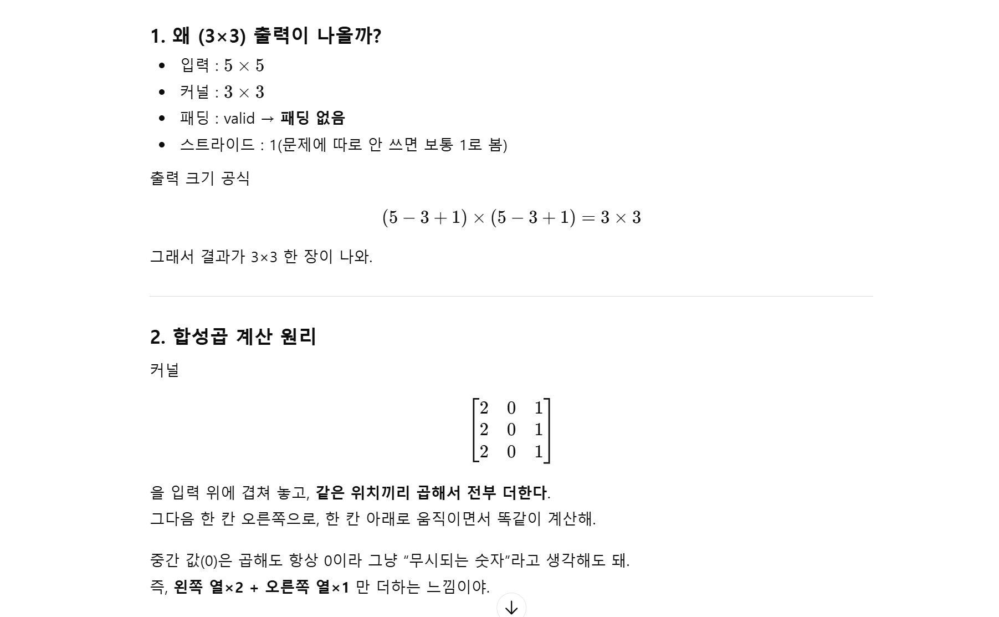
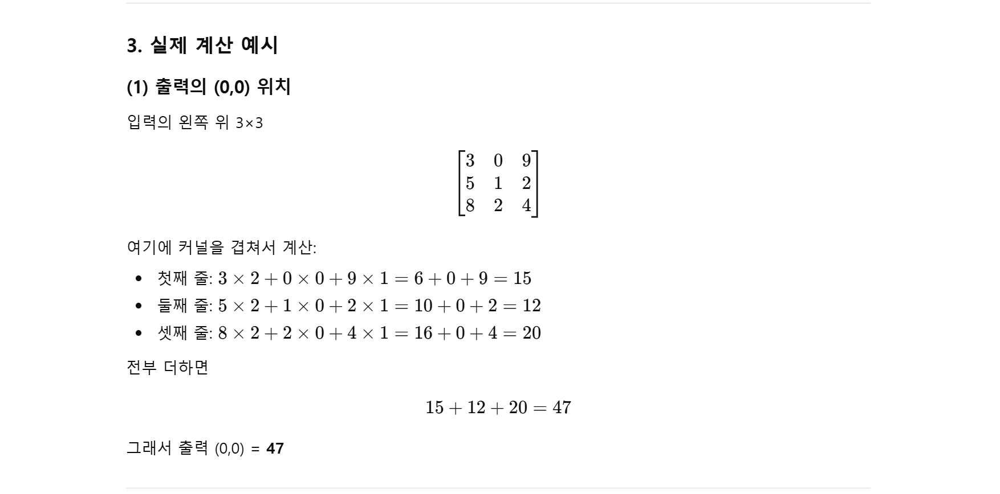  
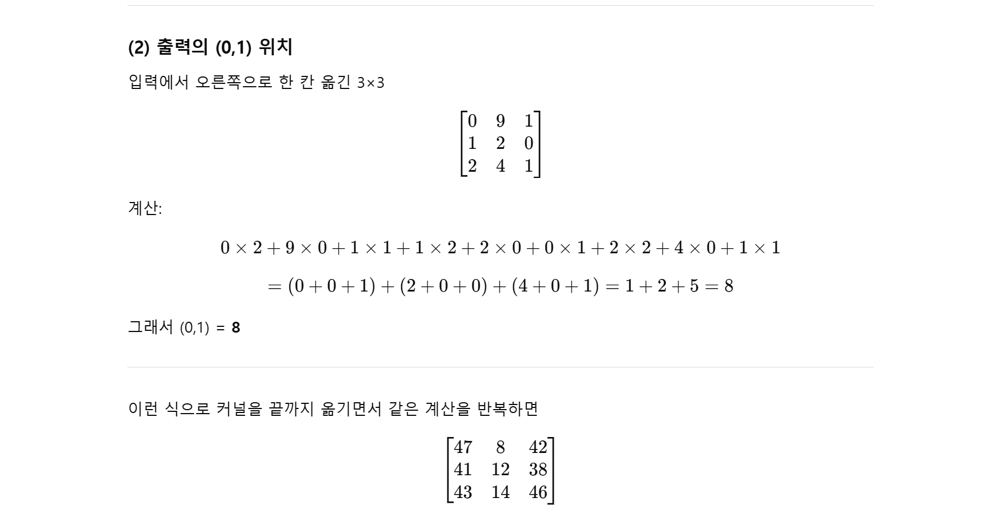

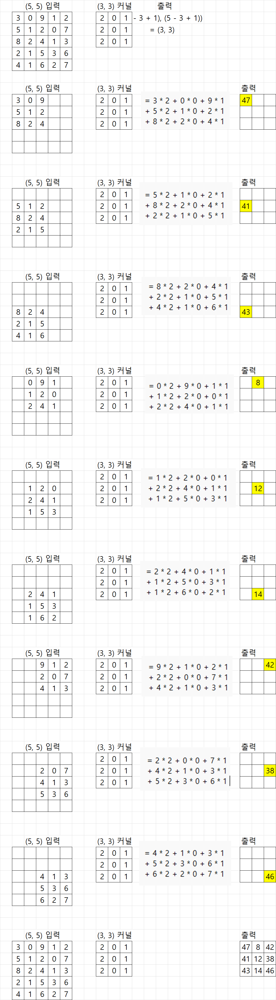

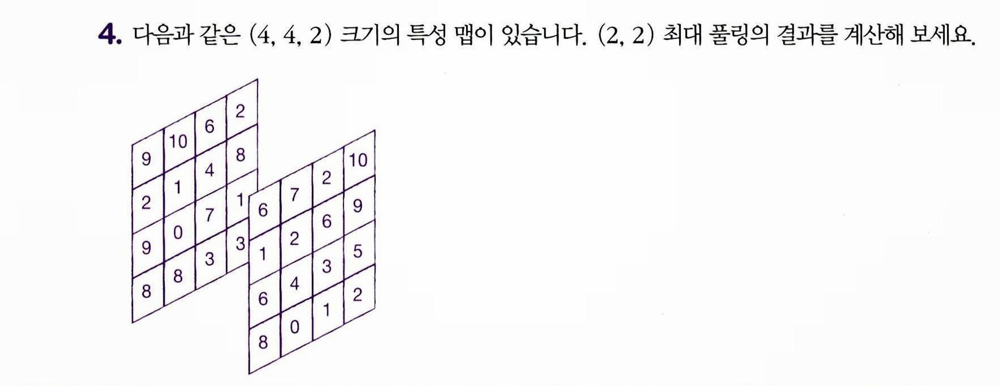